In [1]:
#import necessary libraries 
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn import datasets
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error
from sklearn.metrics import r2_score
from sklearn.preprocessing import PolynomialFeatures

QUESTION 1

Download the MNIST dataset using torch-vision. Split into train, test and validation
dataset. Apply Augmentions to images:
a. Training dataset: RandomRotation(5 degrees), RandomCrop(size=28, padding =
2), ToTensor and Normalize.
b. Testing dataset and validation dataset: ToTensor and Normalize

In [2]:
#loading the MNIST dataset using torch-vision.
from torchvision import datasets, transforms
import torch
import torch.nn as nn


In [3]:
#loading the MNIST dataset using torch-vision.
transform = transforms.Compose([transforms.ToTensor(),transforms.Normalize((0.2,), (0.15,)),])
trainset = datasets.MNIST('MNIST_data/', download=True, train=True, transform=transform)
testset = datasets.MNIST('MNIST_data/', download=True, train=False, transform=transform)

In [4]:
#train and test and validation split
trainset,valset = torch.utils.data.random_split(trainset, [50000, 10000])

In [5]:
#applying augmentation to the training set Training dataset: RandomRotation(5 degrees), RandomCrop(size=28, padding =2), ToTensor and Normalize.
train_transform = transforms.Compose([transforms.RandomRotation(5),transforms.RandomCrop(28, padding=2),transforms.ToTensor(),transforms.Normalize((0.2,), (0.15,)),])

In [6]:
#applying augmentation to the validation set Validation dataset: ToTensor and Normalize.
val_transform = transforms.Compose([transforms.ToTensor(),transforms.Normalize((0.2,), (0.15,)),])

Plot a Few Images from each class. Create a data loader for the training dataset as well
as the testing dataset.

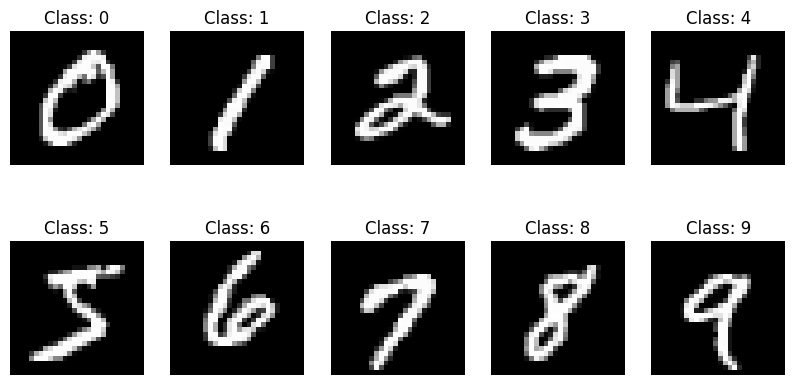

In [7]:
#plotting the images of each class
fig, ax = plt.subplots(2,5, figsize=(10, 5))
for i in range(10):
    ax[i//5, i%5].imshow(trainset.dataset.data[trainset.dataset.targets==i][0], cmap='gray')
    ax[i//5, i%5].set_title('Class: {}'.format(i))
    ax[i//5, i%5].axis('off')
plt.show()


In [8]:
#creating the dataloader for the training set
trainloader = torch.utils.data.DataLoader(trainset, batch_size=64, shuffle=True)
#creating the dataloader for the validation set
valloader = torch.utils.data.DataLoader(valset, batch_size=64, shuffle=True)
#creating the dataloader for the test set
testloader = torch.utils.data.DataLoader(testset, batch_size=64, shuffle=True)

Write a 3-Layer MLP using PyTorch all using Linear layers. Print the number of trainable
parameters of the model.

In [9]:
#writing a 3-layer MLP using pytorch all using linear layers
class MLP(nn.Module):
    def __init__(self):
        super(MLP, self).__init__()
        self.fc1 = nn.Linear(28*28, 196)
        self.fc2 = nn.Linear(196, 98)
        self.fc3 = nn.Linear(98, 10)
        self.relu = nn.ReLU()
    def forward(self, x):
        x = x.view(-1, 28*28)
        x = self.fc1(x)
        x = self.relu(x)
        x = self.fc2(x)
        x = self.relu(x)
        x = self.fc3(x)
        return x
    
#defining the loss function and the optimizer
model = MLP()
criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(model.parameters(), lr=0.001)

In [10]:
#printing the trainable parameters of model
print(model.parameters)

<bound method Module.parameters of MLP(
  (fc1): Linear(in_features=784, out_features=196, bias=True)
  (fc2): Linear(in_features=196, out_features=98, bias=True)
  (fc3): Linear(in_features=98, out_features=10, bias=True)
  (relu): ReLU()
)>


Train the model for 5 epochs using Adam as the optimizer and CrossEntropyLoss as the
Loss Function. Make sure to evaluate the model on the validation set after each epoch
and save the best model as well as log the accuracy and loss of the model on training
and validation data at the end of each epoch.

In [11]:
#calculating training and validation accuracy and training and validation loss for each epoch
train_loss = []
val_loss = []
train_acc = []
val_acc = []
for epoch in range(5):
    running_loss = 0
    running_acc = 0
    for i, data in enumerate(trainloader, 0):
        inputs, labels = data
        optimizer.zero_grad()
        outputs = model(inputs)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()
        running_loss += loss.item()
        _, predicted = torch.max(outputs.data, 1)
        running_acc += (predicted == labels).sum().item()
    train_loss.append(running_loss/len(trainloader))
    train_acc.append(running_acc/len(trainloader.dataset))
    running_loss = 0
    running_acc = 0
    with torch.no_grad():
        for i, data in enumerate(valloader, 0):
            inputs, labels = data
            outputs = model(inputs)
            loss = criterion(outputs, labels)
            running_loss += loss.item()
            _, predicted = torch.max(outputs.data, 1)
            running_acc += (predicted == labels).sum().item()
    val_loss.append(running_loss/len(valloader))
    val_acc.append(running_acc/len(valloader.dataset))
    print('Epoch: {} \tTraining Loss: {:.6f} \tTraining Accuracy: {:.6f} \tValidation Loss: {:.6f} \tValidation Accuracy: {:.6f}'.format(epoch+1, train_loss[-1], train_acc[-1], val_loss[-1], val_acc[-1]))

Epoch: 1 	Training Loss: 0.252805 	Training Accuracy: 0.923460 	Validation Loss: 0.135747 	Validation Accuracy: 0.959500
Epoch: 2 	Training Loss: 0.110511 	Training Accuracy: 0.966040 	Validation Loss: 0.111791 	Validation Accuracy: 0.965400
Epoch: 3 	Training Loss: 0.081380 	Training Accuracy: 0.973780 	Validation Loss: 0.097482 	Validation Accuracy: 0.970500
Epoch: 4 	Training Loss: 0.062801 	Training Accuracy: 0.979440 	Validation Loss: 0.126319 	Validation Accuracy: 0.963600
Epoch: 5 	Training Loss: 0.048869 	Training Accuracy: 0.983900 	Validation Loss: 0.095309 	Validation Accuracy: 0.973900


Visualize correct and Incorrect predictions along with Loss-Epoch and Accuracy-Epoch
graphs for both training and validation.

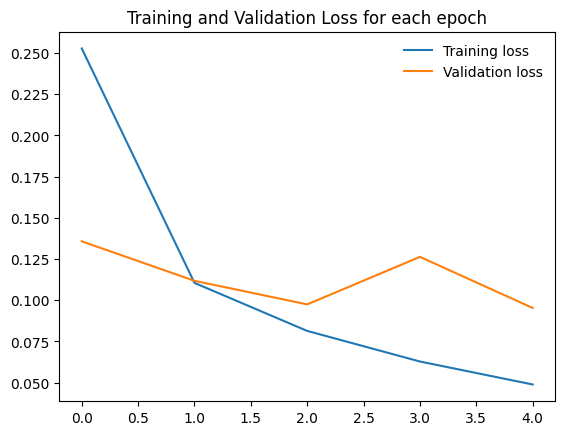

In [12]:
#plotting the training and validation loss for each epoch
plt.plot(train_loss, label='Training loss')
plt.plot(val_loss, label='Validation loss')
plt.legend(frameon=False)
plt.title('Training and Validation Loss for each epoch')
plt.show()

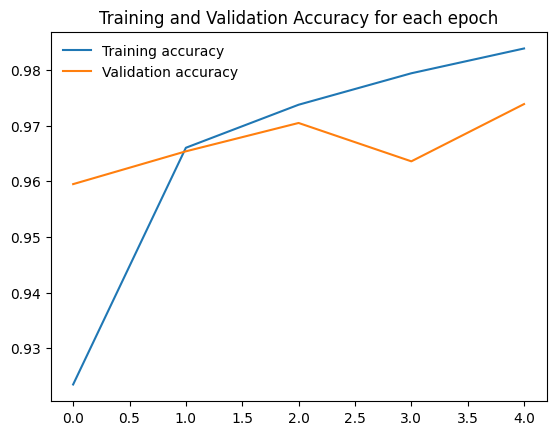

In [13]:
#plotting the training and validation accuracy for each epoch
plt.plot(train_acc, label='Training accuracy')
plt.plot(val_acc, label='Validation accuracy')
plt.legend(frameon=False)
plt.title('Training and Validation Accuracy for each epoch')
plt.show()

QUESTION 3

Part A) Yes, On increasing the model's complexity the fit of model becomes good. And this also converges faster. But the model may overfit the data.

Part B)

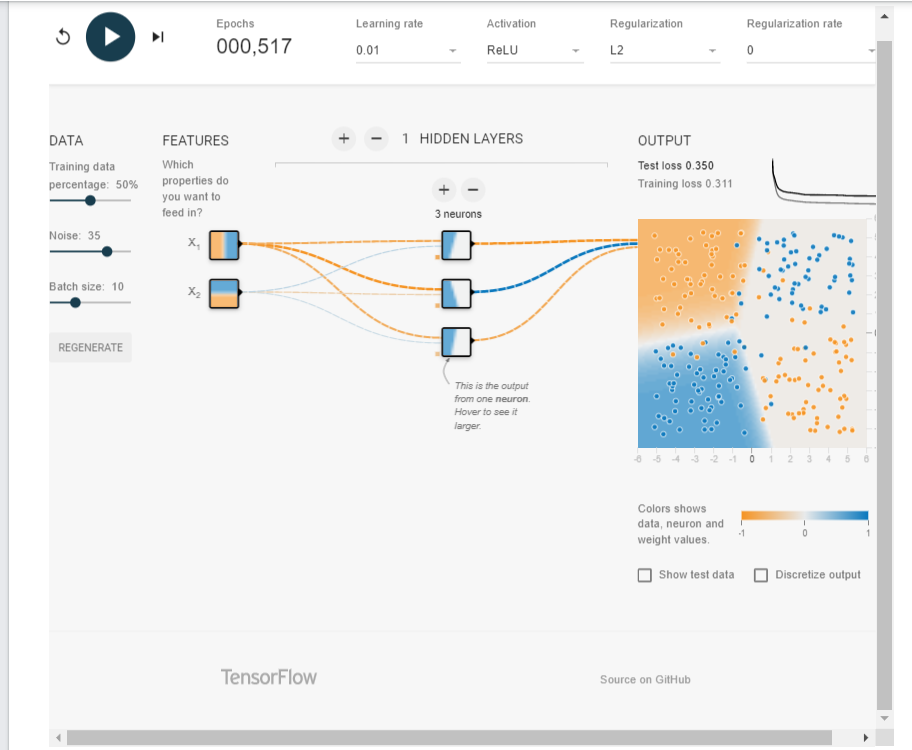

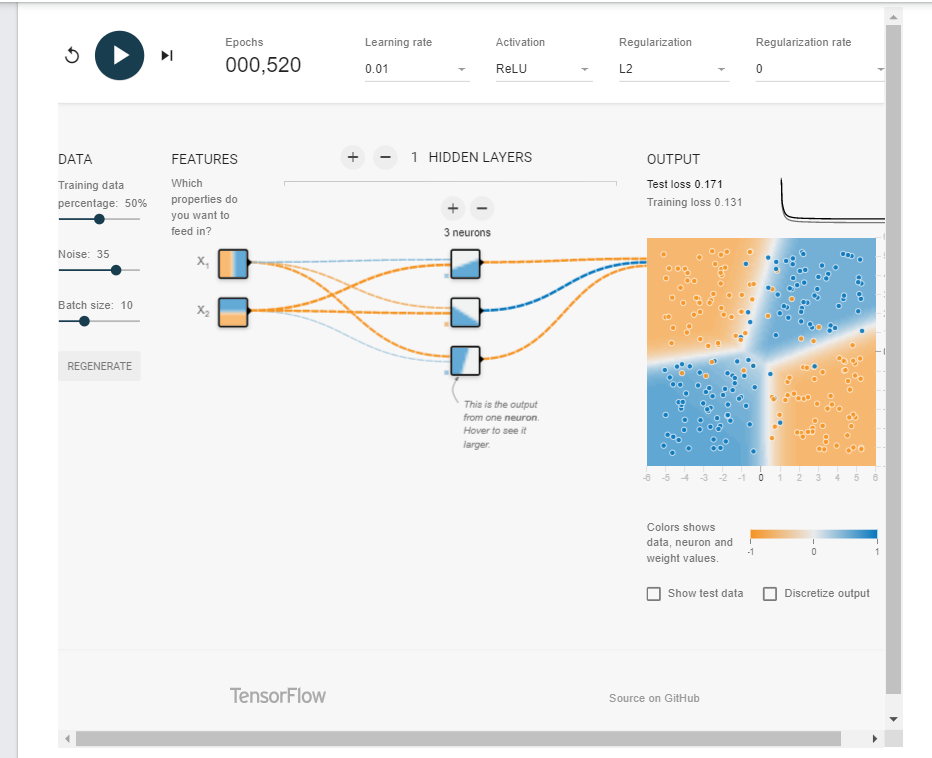

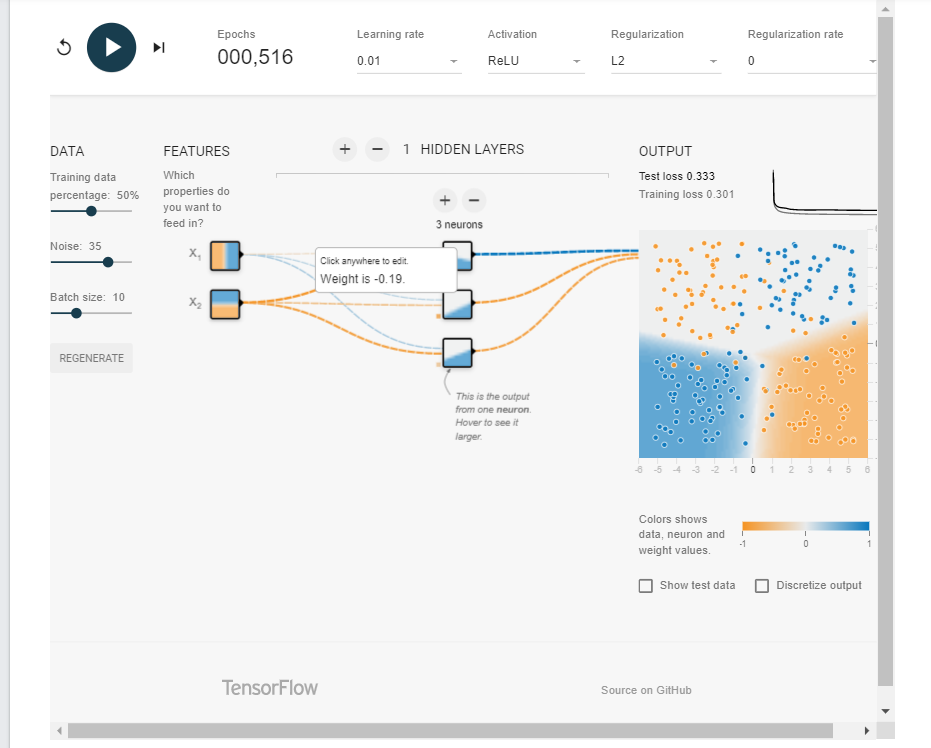

Thre role of Initialization is that on reseting the neural network the weights are initialized randomly. So that the model can learn from the data. So, it gives different decision boundaries for different initializations and also the validation and training accuracy is different for different initializations. And may converge to different local minima and also can converge faster or slower than other initializations.

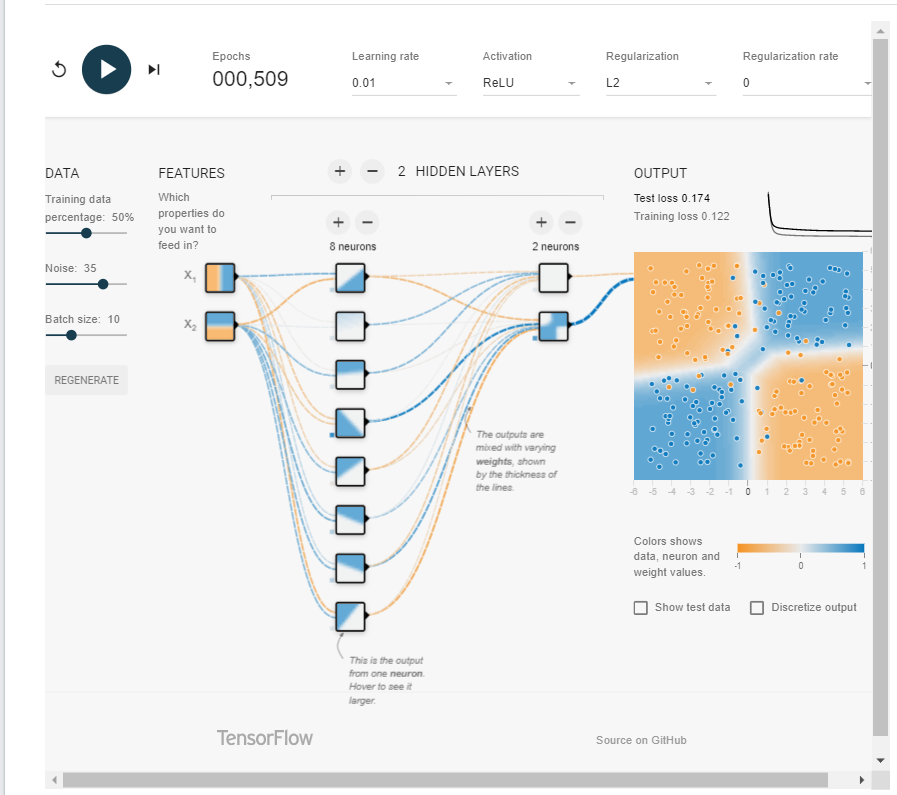

On increasing the number of layers the model becomes more complex and can learn more complex functions. And also the model can fit the data better and converge faster. But the model may overfit the data.

Part C) On adding the extra features don't effect the neural network so much. And also making model extra complex overfits the data. So, adding extra features doesn't effect the model much. But on adding one or two complex features may help it to converge faster and also to fit the data better.

PART B

As we decrease the learning rate the model converges slower. And also the model may not converge at all. And also the model may overfit the data. So, we need to choose the learning rate carefully. In this case the on decreasing the learning rate the model converges to a certain point and then it doesn't converge.

QUESTION 2 ANN FROM SCRATCH

For this classification, you need to use a multi-layer perceptron.
a. Preprocess & visualize the data. Create train, val, and test splits but take into
consideration the class distribution (Hint: Look up stratified splits). ~ [5]


In [14]:
#reading the abalone data
data = pd.read_csv('abalone.data', header=None)
data

,0,1,2,3,4,5,6,7,8
0,M,0.455,0.365,0.095,0.5140,0.2245,0.1010,0.1500,15
1,M,0.350,0.265,0.090,0.2255,0.0995,0.0485,0.0700,7
2,F,0.530,0.420,0.135,0.6770,0.2565,0.1415,0.2100,9
3,M,0.440,0.365,0.125,0.5160,0.2155,0.1140,0.1550,10
4,I,0.330,0.255,0.080,0.2050,0.0895,0.0395,0.0550,7
...,...,...,...,...,...,...,...,...,...
4172,F,0.565,0.450,0.165,0.8870,0.3700,0.2390,0.2490,11
4173,M,0.590,0.440,0.135,0.9660,0.4390,0.2145,0.2605,10
4174,M,0.600,0.475,0.205,1.1760,0.5255,0.2875,0.3080,9
4175,F,0.625,0.485,0.150,1.0945,0.5310,0.2610,0.2960,10


In [15]:
#replace the column names in the data as sex, length, diameter, height, whole weight, shucked weight, viscera weight, shell weight, rings
data.columns = ['sex', 'length', 'diameter', 'height', 'whole weight', 'shucked weight', 'viscera weight', 'shell weight', 'rings']
data.head()

,sex,length,diameter,height,whole weight,shucked weight,viscera weight,shell weight,rings
0,M,0.455,0.365,0.095,0.5140,0.2245,0.1010,0.150,15
1,M,0.350,0.265,0.090,0.2255,0.0995,0.0485,0.070,7
2,F,0.530,0.420,0.135,0.6770,0.2565,0.1415,0.210,9
3,M,0.440,0.365,0.125,0.5160,0.2155,0.1140,0.155,10
4,I,0.330,0.255,0.080,0.2050,0.0895,0.0395,0.055,7


In [16]:
#checking for missing values
data.isnull().sum()

sex               0
length            0
diameter          0
height            0
whole weight      0
shucked weight    0
viscera weight    0
shell weight      0
rings             0
dtype: int64

In [17]:
#printing the count of each class in y
data['rings'].value_counts()

9     689
10    634
8     568
11    487
7     391
12    267
6     259
13    203
14    126
5     115
15    103
16     67
17     58
4      57
18     42
19     32
20     26
3      15
21     14
23      9
22      6
27      2
24      2
1       1
26      1
29      1
2       1
25      1
Name: rings, dtype: int64

In [18]:
#dropping the rows with rings 23,22,27,24,1,26,29,2,25,3,21
data = data.drop(data[data['rings'] == 23].index)
data = data.drop(data[data['rings'] == 22].index)
data = data.drop(data[data['rings'] == 27].index)
data = data.drop(data[data['rings'] == 24].index)
data = data.drop(data[data['rings'] == 1].index)
data = data.drop(data[data['rings'] == 26].index)
data = data.drop(data[data['rings'] == 29].index)
data = data.drop(data[data['rings'] == 2].index)
data = data.drop(data[data['rings'] == 25].index)
data = data.drop(data[data['rings'] == 3].index)
data = data.drop(data[data['rings'] == 21].index)

In [19]:
#separating the features and the target
X = data.drop('rings', axis=1)
y = data['rings']

In [20]:
#encoding the data with ordinal encoder
from sklearn.preprocessing import OrdinalEncoder
enc = OrdinalEncoder()
X = enc.fit_transform(X)


In [21]:
#converting x to dataframe
X = pd.DataFrame(X)
X.columns = ['sex', 'length', 'diameter', 'height', 'whole weight', 'shucked weight', 'viscera weight', 'shell weight']
X.head()

,sex,length,diameter,height,whole weight,shucked weight,viscera weight,shell weight
0,2.0,63.0,53.0,17.0,702.0,411.0,197.0,259.0
1,2.0,42.0,33.0,16.0,272.0,172.0,92.0,109.0
2,0.0,78.0,64.0,25.0,949.0,473.0,278.0,370.0
3,2.0,60.0,53.0,23.0,705.0,394.0,223.0,269.0
4,1.0,38.0,31.0,14.0,240.0,153.0,74.0,83.0


In [22]:
#filter warnings
import warnings
warnings.filterwarnings('ignore')

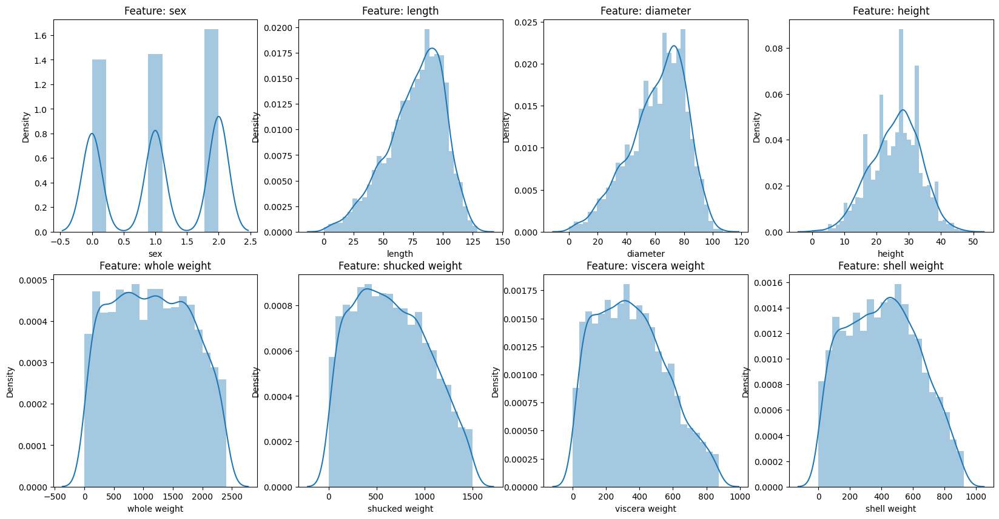

In [23]:
#visualization of the data
import seaborn as sns
#plotting the distribution of each feature
fig, ax = plt.subplots(2,4, figsize=(20, 10))
for i in range(8):
    sns.distplot(X.iloc[:,i], ax=ax[i//4, i%4])
    ax[i//4, i%4].set_title('Feature: {}'.format(X.columns[i]))
plt.show()


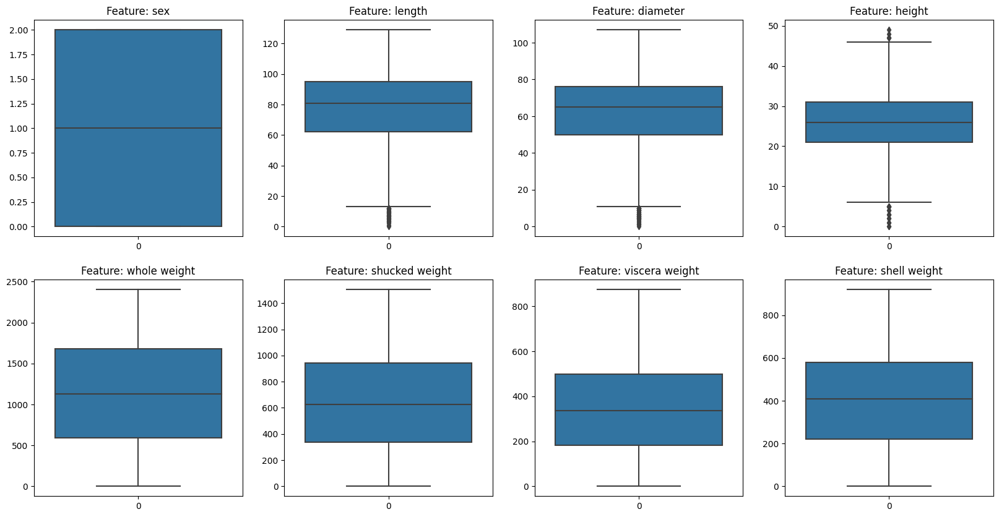

In [24]:
#plotting the boxplot of each feature
fig, ax = plt.subplots(2,4, figsize=(20, 10))
for i in range(8):
    sns.boxplot(X.iloc[:,i], ax=ax[i//4, i%4])
    ax[i//4, i%4].set_title('Feature: {}'.format(X.columns[i]))
plt.show()

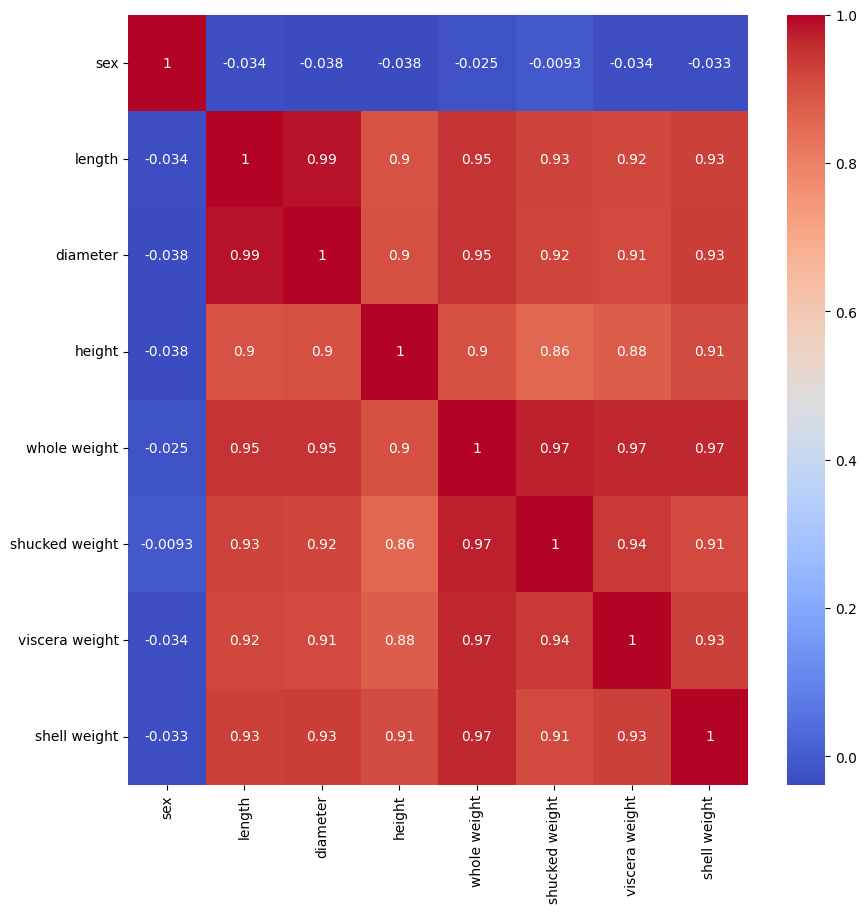

In [25]:
#plotting the correlation matrix
plt.figure(figsize=(10, 10))
sns.heatmap(X.corr(), annot=True,cmap='coolwarm')
plt.show()

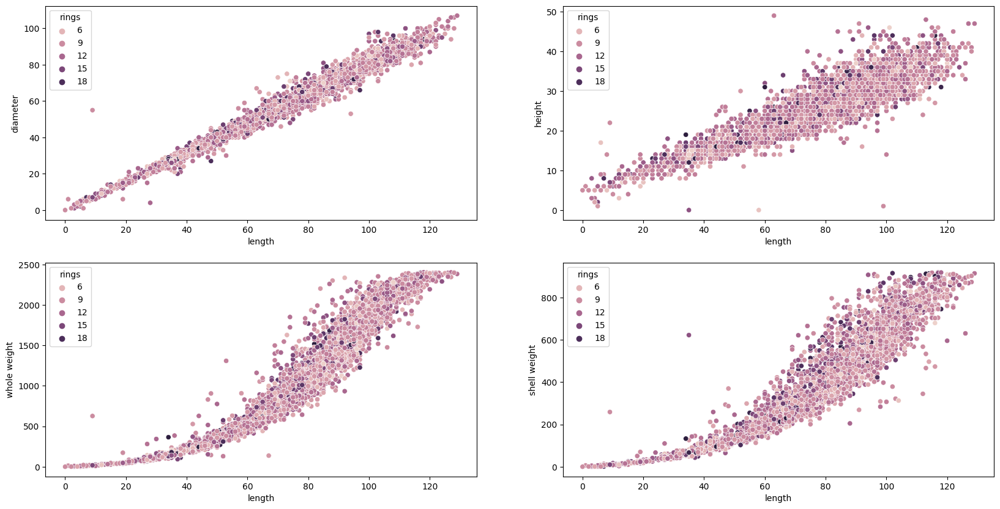

In [26]:
#plotting scatter plot for two features four plots in subplots
fig, ax = plt.subplots(2,2, figsize=(20, 10))
sns.scatterplot(data = X, x = 'length', y = 'diameter', ax=ax[0,0], hue=y)
sns.scatterplot(data = X, x = 'length', y = 'height', ax=ax[0,1], hue=y)
sns.scatterplot(data = X, x = 'length', y = 'whole weight', ax=ax[1,0], hue=y)
sns.scatterplot(data = X, x = 'length', y = 'shell weight', ax=ax[1,1], hue=y)
plt.show()

In [27]:
#train, validation and test split using stratified splits
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)
X_train, X_val, y_train, y_val = train_test_split(X_train, y_train, test_size=0.2, random_state=42, stratify=y_train)

X_train.head()

,sex,length,diameter,height,whole weight,shucked weight,viscera weight,shell weight
2580,2.0,126.0,100.0,41.0,2372.0,1475.0,844.0,871.0
3758,1.0,77.0,60.0,23.0,778.0,448.0,233.0,307.0
1737,1.0,63.0,47.0,19.0,558.0,419.0,168.0,165.0
2777,1.0,63.0,50.0,19.0,593.0,389.0,209.0,186.0
3566,2.0,96.0,72.0,30.0,1372.0,921.0,395.0,402.0


b. Implement a multi-layer perceptron from scratch. This would include the following
~[40]
a. Write activation functions.
b. Forward propagate the input.
c. Back propagate the error.
d. Train the network using stochastic gradient descent.
e. Predict the output for a given test sample and compute the accuracy.

In [28]:
#standardizing the data using standard scaler X_train and X_val
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_val = scaler.transform(X_val)

In [29]:
# checking for unique values in the y_train and y_val
print(np.unique(y_train))
print(np.unique(y_val))

[ 4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20]
[ 4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20]


In [30]:
#substracting 3 from the y_train and y_val
y_train = y_train-4
y_val = y_val-4

In [31]:
batch_size = 32

In [32]:
# making no of rows divisible by batch size
X_train = X_train[:-(len(X_train)%batch_size)]
y_train = y_train[:-(len(y_train)%batch_size)]
X_val = X_val[:-(len(X_val)%batch_size)]
y_val = y_val[:-(len(y_val)%batch_size)]

In [33]:
# checking for unique values in the y_train and y_val and their counts
print(np.unique(y_train, return_counts=True))

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16],
      dtype=int64), array([ 37,  74, 165, 249, 361, 437, 402, 309, 171, 130,  81,  64,  42,
        37,  27,  21,  17], dtype=int64))


In [34]:
print(np.unique(y_val, return_counts=True))

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16],
      dtype=int64), array([  9,  17,  40,  61,  91, 106,  99,  76,  41,  31,  17,  16,  11,
         9,   7,   5,   4], dtype=int64))


In [35]:
# shape of X_train and y_train
print(X_train.shape)
print(y_train.shape)
print

(2624, 8)
(2624,)


<function print(*args, sep=' ', end='\n', file=None, flush=False)>

In [36]:
# preparing y_train and y_val to pass to the model making as dimensions as (n_samples, n_classes)
y_train_pre = np.zeros((len(y_train), 17))
y_val_pre = np.zeros((len(y_val), 17))

In [37]:
# converting y_train and y_val to numpy array
y_train = np.array(y_train)
y_val = np.array(y_val)

In [38]:
# filling the y_train_pre and y_val_pre if value of y_train and y_val is equal to the index of y_train_pre and y_val_pre then fill it with 1
for i in range(len(y_train)):
    y_train_pre[i][y_train[i]] = 1

for i in range(len(y_val)):
    y_val_pre[i][y_val[i]] = 1

# shape of y_train_pre and y_val_pre
print(y_train_pre.shape)
print(y_val_pre.shape)

(2624, 17)
(640, 17)


In [39]:
print(y_train_pre)
print(y_val_pre)

[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 1. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]
[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]


Now experiment with different activation functions (at least 3 & to be written from
scratch) and comment (in the report) on how the accuracy varies. Create plots to
support your arguments. ~[5]


In [40]:
# import accuracy score
from sklearn.metrics import accuracy_score
class NeuralNet():
        
    def __init__(self, layers=[8,100,17], learning_rate=0.1, iterations=100, activation=None,weights_type='random'):
        self.params = {}
        self.learning_rate = learning_rate
        self.iterations = iterations
        self.loss = []
        self.sample_size = None
        self.layers = layers
        self.activation = activation
        self.X = None
        self.y = None
        # self.yhat_final = None
        self.weights_type = weights_type
    def init_weights(self):
        # np.random.seed(1) # Seed the random number generator
        if self.weights_type == 'random':
            self.params["W1"] = np.random.randn(self.layers[0], self.layers[1]) 
            self.params['b1']  =np.random.randn(self.layers[1],)
            self.params['W2'] = np.random.randn(self.layers[1],self.layers[2]) 
            self.params['b2'] = np.random.randn(self.layers[2],)
        if self.weights_type == 'zeros':
            self.params["W1"] = np.zeros((self.layers[0], self.layers[1]))
            self.params['b1']  =np.zeros((self.layers[1],))
            self.params['W2'] = np.zeros((self.layers[1],self.layers[2]))
            self.params['b2'] = np.zeros((self.layers[2],))
        elif self.weights_type == 'ones':
            self.params["W1"] = np.ones((self.layers[0], self.layers[1]))
            self.params['b1']  =np.ones((self.layers[1],))
            self.params['W2'] = np.ones((self.layers[1],self.layers[2]))
            self.params['b2'] = np.ones((self.layers[2],))
    def relu(self,Z):
        return np.maximum(0,Z)

    def dRelu(self, x):
        x[x<=0] = 0
        x[x>0] = 1
        return x

    def eta(self, x):
      ETA = 0.000001
      return np.maximum(x, ETA)


    def sigmoid(self,Z):
        return 1/(1+np.exp(-Z))
    
    def dSigmoid(self,Z):
        return Z * (1 - Z)
    
    def tanh(self,Z):
        return np.tanh(Z)
    
    def dTanh(self,Z):
        return 1 - np.square(Z)
    def softmax(self,Z):
        exps = np.exp(Z - np.max(Z))
        return exps / np.sum(exps)

    def entropy_loss(self,y, yhat):
        y = np.argmax(y, axis=1)
        yhat = np.argmax(yhat, axis=1)
        nsample = len(y)
        # yhat = self.eta(yhat) # clips value to avoid NaNs in log
        loss = -1/nsample * np.sum(y * np.log(yhat))
        return loss

    def forward_propagation(self):
        
        Z1 = self.X.dot(self.params['W1']) + self.params['b1']
        if self.activation == 'relu':
            A1 = self.relu(Z1)
            # A1 = self.eta(A1)
        elif self.activation == 'sigmoid':
            A1 = self.sigmoid(Z1)
            # A1 = self.eta(A1)
        elif self.activation == 'tanh':
            A1 = self.tanh(Z1)
            # A1 = self.eta(A1)
        Z2 = A1.dot(self.params['W2']) + self.params['b2']
        # using softmax activation function for output layer
        A2 = self.softmax(Z2)
        # A2 = self.eta(A2)
        yhat = A2
        loss = self.entropy_loss(self.y,yhat)
        # save calculated parameters     
        self.params['Z1'] = Z1
        self.params['Z2'] = Z2
        self.params['A1'] = A1

        return yhat,loss
    

In [41]:
# running the model on the training data
model = NeuralNet(activation='relu',weights_type='random',iterations=1000,learning_rate=0.01)
model.fit(X_train, y_train_pre)

ValueError: operands could not be broadcast together with shapes (2624,17) (17,100) 

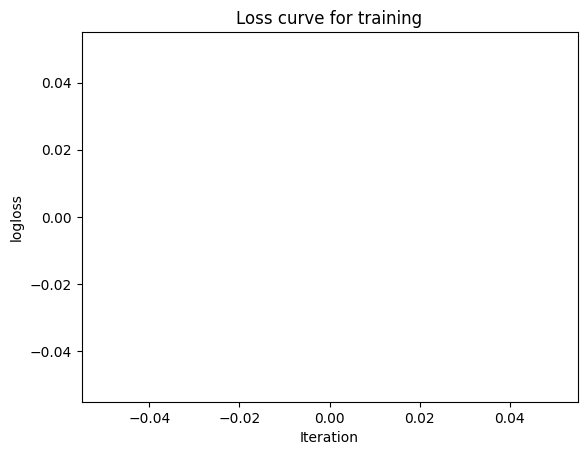

In [ ]:
# plotting the loss curve
model.plot_loss()

In [ ]:
# printing the accuracy on the training data
print("Training accuracy: ", model.accuracy(y_train_pre, model.predict(X_train)))
# printing the accuracy on the test data
print("Test accuracy: ", model.forward_propagation_test(X_val, y_val_pre))

Training accuracy:  0.014100609756097561
Test accuracy:  0.0140625


W1:  [[ 6.71703552e+01 -1.10393455e+01 -3.47249622e+00 -8.19269031e+00
   5.91045058e+00  7.22761532e+00 -4.48224885e-01  7.46047483e+00
   8.44032112e-01 -9.93862344e+00 -1.37989073e-01  9.07316394e+00
  -2.77499351e+00 -4.90855806e+01  7.99897181e+00 -7.10613387e-01
  -4.12146949e+00  4.08688076e+00 -1.01648906e+01  9.72482720e+00
   3.83934764e+00  5.93010974e+00  2.96916307e+00 -9.10754794e+00
  -2.19745510e+01  3.07093867e+00  3.66891554e+01 -2.21357191e+01
   7.22922163e-01 -5.45306279e+01 -6.01009120e+00 -1.00088356e+01
   2.25563247e+00  5.59781011e-03 -3.89786646e+00  1.11807839e-01
   4.11470336e+01  1.32035473e+01 -2.83210785e+00  1.43581552e+01
  -1.54110230e+01  1.64136649e+00 -2.60114593e+00 -8.10469396e+00
  -2.70682417e+01  1.27575288e+01 -1.85789402e+01 -1.40790914e+00
  -1.74075736e+01 -5.09748869e+00 -3.87950080e+01 -2.45970783e+01
   1.55315651e+01  6.67763823e-01 -4.05580433e+00 -3.79021842e+00
   7.41975615e+00  1.57194877e+00  8.87582868e-01  2.48926217e+01
   6.

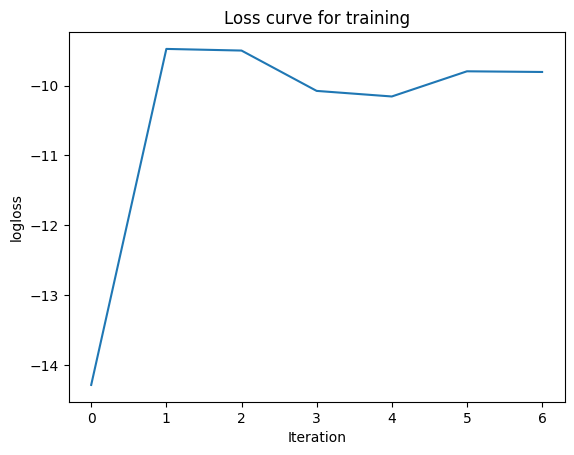

Training accuracy:  0.014100609756097561
Test accuracy:  0.0140625


In [ ]:
# same model application for sigmoid activation function
model1 = NeuralNet(activation='sigmoid',weights_type='random',iterations=1000,learning_rate=0.01)
model1.fit(X_train, y_train_pre)
model1.plot_loss()
print("Training accuracy: ", model1.accuracy(y_train_pre, model1.predict(X_train)))
print("Test accuracy: ", model1.forward_propagation_test(X_val, y_val_pre))

W1:  [[-9.51525481e+01  1.93598029e+00 -1.70879755e+01  2.44603343e+00
  -4.64163990e+00  2.40908656e+01  1.26116272e+01  4.97311516e+01
  -1.85622029e+01  4.82267023e+00  2.26669635e+00  3.34565389e+00
  -2.07916673e+00 -1.81460977e+01  1.73078781e+01 -1.31258537e+00
  -2.39266946e-02 -1.50362353e+01 -1.08244025e+01 -3.95880130e+01
   2.73617428e+00  1.00962579e+02  9.78828531e+00 -6.48646007e+00
   1.70183844e+00  5.61589564e-02 -1.69316739e+01 -3.87869798e+00
  -1.45109188e+00 -7.54072333e+01 -3.11901634e+00 -5.74951836e+00
  -4.21335812e-02 -5.37379862e+00 -2.76949168e+00  2.51409271e+01
  -1.74659016e+00 -1.77914728e+01  9.41205622e+00 -4.12149486e+01
  -1.14421820e+01  1.06606958e+00  6.74588421e-01 -2.37378629e+01
  -1.91079176e+00 -9.74292729e+00 -4.71529580e+01 -2.47564267e+01
   1.02310526e+02 -3.68348217e+01 -7.14693430e+00 -4.25125488e-01
   1.68933544e+00 -7.36211496e+00 -2.47795915e+00 -1.78550145e+02
  -6.81121362e+01  4.66607156e+01 -2.53583135e+00 -1.98435283e+01
  -1.

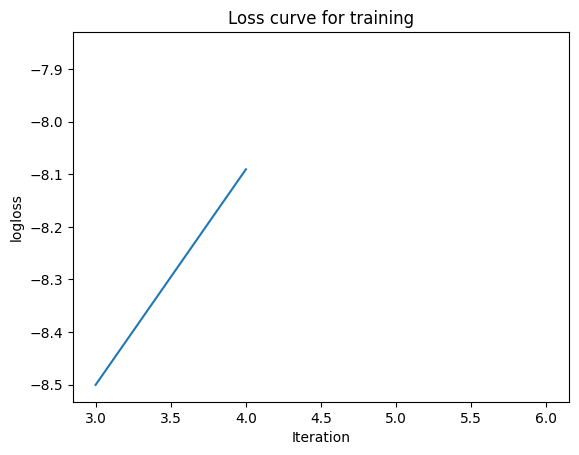

Training accuracy:  0.014100609756097561
Test accuracy:  0.0140625


In [ ]:
# training the model for tanh activation function
model2 = NeuralNet(activation='tanh',weights_type='random',iterations=1000,learning_rate=0.01)
model2.fit(X_train, y_train_pre)
model2.plot_loss()
print("Training accuracy: ", model2.accuracy(y_train_pre, model2.predict(X_train)))
print("Test accuracy: ", model2.forward_propagation_test(X_val, y_val_pre))


Experiment with different weight initialization: Random, Zero & Constant. Create plots
to support your arguments. ~[5]


W1:  [[-9.57121060e+00 -1.81777477e+01 -2.64814814e+00 -4.45569118e+00
   6.76874552e+00 -8.78577911e+00  9.76528772e+00  5.62911685e+00
   2.21824682e+00  1.82907337e+01  1.58532629e+01  3.50747686e+00
  -3.92476387e+00 -8.63585011e+00 -7.04281810e+00  1.51194274e+01
   2.47874505e+00 -4.58642509e+00 -1.04040107e+01  2.22763975e+01
   1.05568751e+00  1.31005354e+01 -1.82425461e+00  8.67100434e-03
  -1.05469083e+01  1.37556966e+00 -7.88581969e+00 -5.44708748e+00
   1.00065446e+01 -3.74351678e+00 -3.52663625e+00  4.71389527e+00
  -3.88329608e+01 -2.08156838e-01  1.71229100e+00 -9.54522369e+00
   8.26835037e+00  3.43320372e+00  2.36212911e-01  6.71338229e+00
  -3.05547727e+00 -3.36063691e+01  1.26639390e+01  9.49330385e-01
  -1.35342469e+01 -1.20512340e+01 -6.44898444e+00  1.18627368e+01
  -7.78639082e-01 -2.33528812e+01  2.02011709e+00  1.07735329e+01
  -2.19757439e+00 -3.97395901e+00 -8.37518669e+00 -4.33199425e+00
   4.27052177e+00 -4.19817899e-01  9.37047670e+00 -3.53286318e-01
  -1.

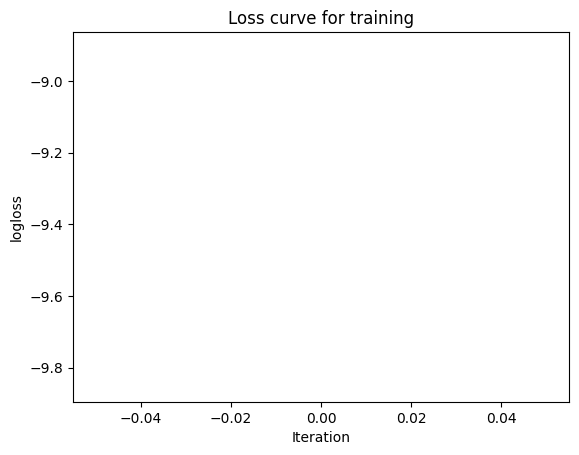

Training accuracy:  0.014100609756097561
Test accuracy:  0.0140625


In [ ]:
# intializing the model with different weights and bias
model3 = NeuralNet(activation='relu',weights_type='random')
model3.fit(X_train, y_train_pre)
model3.plot_loss()
print("Training accuracy: ", model3.accuracy(y_train_pre, model3.predict(X_train)))
print("Test accuracy: ", model3.forward_propagation_test(X_val, y_val_pre))

W1:  [[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
  0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
  0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
  0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
  0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
  0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
  0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
  0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
  0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
  0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
  0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
  0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
  0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 

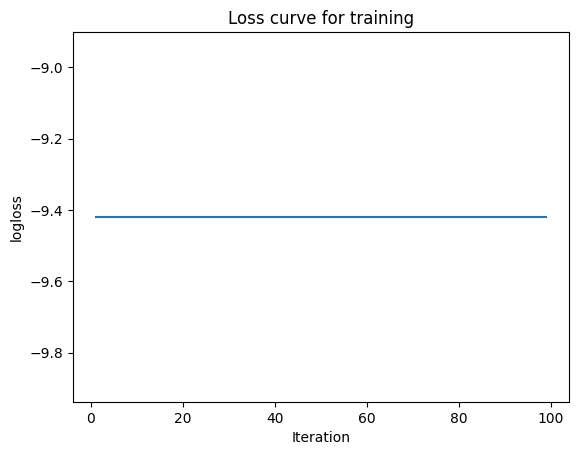

Training accuracy:  0.16653963414634146
Test accuracy:  0.165625


In [ ]:
# weights and bias initialization with zeros
model4 = NeuralNet(activation='relu',weights_type='zeros')
model4.fit(X_train, y_train_pre)
model4.plot_loss()
print("Training accuracy: ", model4.accuracy(y_train_pre, model4.predict(X_train)))
print("Test accuracy: ", model4.forward_propagation_test(X_val, y_val_pre))

W1:  [[ 13.93250862  13.93250862  13.93250862  13.93250862  13.93250862
   13.93250862  13.93250862  13.93250862  13.93250862  13.93250862
   13.93250862  13.93250862  13.93250862  13.93250862  13.93250862
   13.93250862  13.93250862  13.93250862  13.93250862  13.93250862
   13.93250862  13.93250862  13.93250862  13.93250862  13.93250862
   13.93250862  13.93250862  13.93250862  13.93250862  13.93250862
   13.93250862  13.93250862  13.93250862  13.93250862  13.93250862
   13.93250862  13.93250862  13.93250862  13.93250862  13.93250862
   13.93250862  13.93250862  13.93250862  13.93250862  13.93250862
   13.93250862  13.93250862  13.93250862  13.93250862  13.93250862
   13.93250862  13.93250862  13.93250862  13.93250862  13.93250862
   13.93250862  13.93250862  13.93250862  13.93250862  13.93250862
   13.93250862  13.93250862  13.93250862  13.93250862  13.93250862
   13.93250862  13.93250862  13.93250862  13.93250862  13.93250862
   13.93250862  13.93250862  13.93250862  13.93250862  13

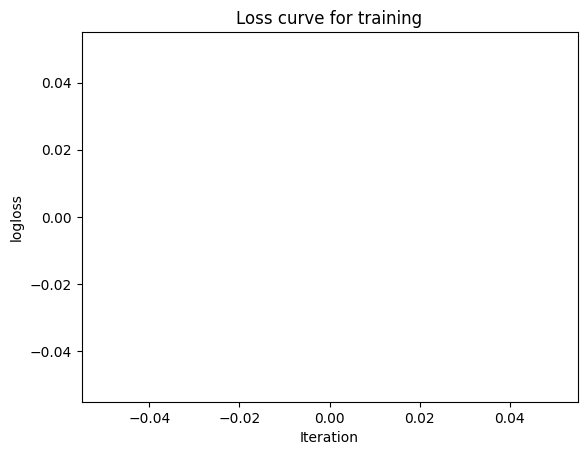

Training accuracy:  0.014100609756097561
Test accuracy:  0.0140625


In [ ]:
# weights and bias initialization with ones
model5 = NeuralNet(activation='relu',weights_type='ones')
model5.fit(X_train, y_train_pre)
model5.plot_loss()
print("Training accuracy: ", model5.accuracy(y_train_pre, model5.predict(X_train)))
print("Test accuracy: ", model5.forward_propagation_test(X_val, y_val_pre))

Change the number of hidden nodes and comment upon the training and accuracy.
Create plots to support your arguments.Add a provision to save and load weights in the
MLP.~[5]


W1:  [[-1.80198637e+01  6.34461555e+00 -6.84135084e+00 -4.29328962e+00
  -8.54264800e+00 -5.81218308e+00  8.02448059e+00 -5.96126979e+00
   4.80469913e+00  1.31807695e+01 -5.66124678e+00 -7.24087139e+00
   4.20769442e+01 -4.44563547e+01 -4.42952332e+01 -2.71518133e+00
  -3.38478743e+00  5.86031322e+00  6.86239244e+00  5.78641183e+01
  -1.70865171e+00  2.19010349e+01  6.48221691e+00 -5.91552275e+00
  -1.38825208e+00  1.56268094e+00  2.75652212e+00  6.45312323e-02
  -5.42433819e-01  2.09307955e-03 -1.30808144e+00 -1.00369875e+00
   7.94771819e+00  5.32810785e+00 -9.33880646e+00  9.44216928e+00
   1.41458763e+01 -4.53786103e+00 -2.82776339e+01  1.35603824e+01
   2.79267310e+01  2.25267605e+01 -6.08909658e+00 -3.63325640e-01
  -2.38341719e+00  6.74689310e+00  3.67687472e+01  5.33750844e+00
  -1.09534884e+00  3.64578992e+00]
 [-6.50650929e+01  2.89515938e+01 -1.59067228e+01 -1.66584494e+01
  -2.99863676e+01  3.85821919e+01  4.63217077e+01  1.16795471e+01
   4.82801984e+01  1.53818121e+00  1

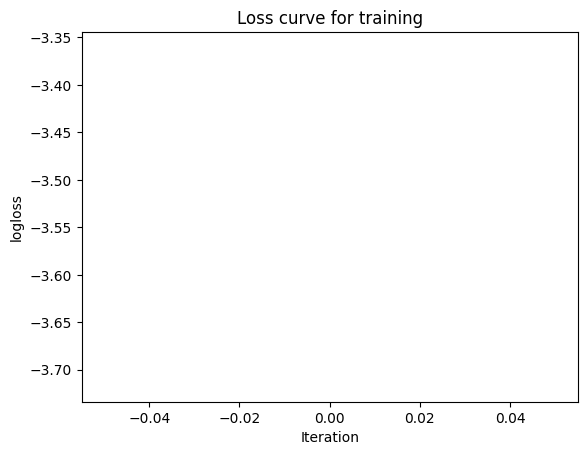

Training accuracy:  0.014100609756097561
Test accuracy:  0.0140625


In [ ]:
# changing the hidden nodes to 50
model6 = NeuralNet(activation='relu',layers=[8,50,17])
model6.fit(X_train, y_train_pre)
model6.plot_loss()
print("Training accuracy: ", model6.accuracy(y_train_pre, model6.predict(X_train)))
print("Test accuracy: ", model6.forward_propagation_test(X_val, y_val_pre))